# Programming For Data Science Summative 1 #
## Social Network Analysis of Yellow Cab Journeys in NYC ##

In [1]:
# import image module - imported earlier than standard so image could be shown at the top of the notebook
from IPython.display import Image

# display image
Image(url="https://publish.purewow.net/wp-content/uploads/sites/2/2018/05/nyc-yellow-taxi-in-times-square-hero.jpg",
      width=1026, height=568)

Add caption/reference

## Installing and Importing Libraries ##

In [ ]:
# Importing libraries that are needed for this Social Network Analysis

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import geopandas as gpd
import pyarrow.parquet as pq
import numpy as np
import matplotlib.colors as mcolors
import seaborn as sns
import plotly.graph_objects as go 
import plotly.express as px
import scipy as sp
from shapely.geometry import Polygon, MultiPolygon



## Chapter 1: Introduction ##

To add

## Chapter 2: Importing Data ##

In [2]:
# Load Taxi journey data
trips_path = 'yellow_tripdata_2025-11.parquet'
all_trips = pq.read_table(trips_path).to_pandas()

all_trips.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee,cbd_congestion_fee
0,7,2025-11-01 00:13:25,2025-11-01 00:13:25,1.0,1.68,1.0,N,43,186,1,14.9,0.00,0.5,1.50,0.00,1.0,22.15,2.5,0.00,0.75
1,2,2025-11-01 00:49:07,2025-11-01 01:01:22,1.0,2.28,1.0,N,142,237,1,14.2,1.00,0.5,4.99,0.00,1.0,24.94,2.5,0.00,0.75
2,1,2025-11-01 00:07:19,2025-11-01 00:20:41,0.0,2.70,1.0,N,163,238,1,15.6,4.25,0.5,4.27,0.00,1.0,25.62,2.5,0.00,0.75
3,2,2025-11-01 00:00:00,2025-11-01 01:01:03,3.0,12.87,1.0,N,138,261,1,66.7,6.00,0.5,0.00,6.94,1.0,86.14,2.5,1.75,0.75
4,1,2025-11-01 00:18:50,2025-11-01 00:49:32,0.0,8.40,1.0,N,138,37,2,39.4,7.75,0.5,0.00,0.00,1.0,48.65,0.0,1.75,0.00


In [3]:
# Load NYC taxi zone data
zones_path = "NYC_Taxi_Zones.geojson" 
zones = gpd.read_file(zones_path)

zones.head()

,shape_area,objectid,shape_leng,location_id,zone,borough,geometry
0,0.0007823067885,1,0.116357453189,1,Newark Airport,EWR,"MULTIPOLYGON (((-74.18445 40.695, -74.18449 40..."
1,0.00486634037837,2,0.43346966679,2,Jamaica Bay,Queens,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ..."
2,0.000314414156821,3,0.0843411059012,3,Allerton/Pelham Gardens,Bronx,"MULTIPOLYGON (((-73.84793 40.87134, -73.84725 ..."
3,0.000111871946192,4,0.0435665270921,4,Alphabet City,Manhattan,"MULTIPOLYGON (((-73.97177 40.72582, -73.97179 ..."
4,0.000497957489363,5,0.0921464898574,5,Arden Heights,Staten Island,"MULTIPOLYGON (((-74.17422 40.56257, -74.17349 ..."


## Chapter 3: Initial Data Cleaning and Manipulation ## 

### all_trips Dataframe ###

In [4]:
all_trips.drop(columns = ['VendorID', 'passenger_count', 'RatecodeID',
                          'store_and_fwd_flag', 'payment_type', 'fare_amount', 
                          'extra', 'mta_tax', 'tip_amount', 'tolls_amount', 
                          'improvement_surcharge', 'congestion_surcharge', 
                          'Airport_fee', 'cbd_congestion_fee'], inplace = True)
all_trips.head()

,tpep_pickup_datetime,tpep_dropoff_datetime,trip_distance,PULocationID,DOLocationID,total_amount
0,2025-11-01 00:13:25,2025-11-01 00:13:25,1.68,43,186,22.15
1,2025-11-01 00:49:07,2025-11-01 01:01:22,2.28,142,237,24.94
2,2025-11-01 00:07:19,2025-11-01 00:20:41,2.70,163,238,25.62
3,2025-11-01 00:00:00,2025-11-01 01:01:03,12.87,138,261,86.14
4,2025-11-01 00:18:50,2025-11-01 00:49:32,8.40,138,37,48.65


In [5]:
all_trips.dtypes

tpep_pickup_datetime     datetime64[us]
tpep_dropoff_datetime    datetime64[us]
trip_distance                   float64
PULocationID                      int32
DOLocationID                      int32
total_amount                    float64
dtype: object

In [6]:
all_trips.shape

(4181444, 6)

In [7]:
def count_invalid_times(df):
    """
    Counts the number of invalid journeys due to zero or negative duration trips
    Returns: Count of invalid trips
    """
    mask = df["tpep_dropoff_datetime"] < df["tpep_pickup_datetime"]
    mask
    return mask.sum(), mask

# Use function to determine invalid trips
invalid_count, invalid_rows = count_invalid_times(all_trips)

# Print number of valid and invalid trips
print(invalid_rows.value_counts())

# Remove invlaid rows
all_trips = all_trips[~invalid_rows]

# Check correct number of rows have been removed
all_trips.shape

False    4180009
True        1435
Name: count, dtype: int64


(4180009, 6)

In [8]:
def count_long_durations(df):
    """
    Count the number of trips outside 1.5 * IQR
    Returns: Mask of invalid trips
    """
    
    df['Duration'] = df["tpep_dropoff_datetime"] - df["tpep_pickup_datetime"]

    Q1 = all_trips["Duration"].quantile(0.25)
    Q3 = all_trips["Duration"].quantile(0.75)
    IQR = Q3 - Q1
    upper_bound = pd.Timedelta(Q3 + 1.5 * IQR)
    lower_bound = pd.Timedelta(Q1 - 1.5 * IQR)
    print(upper_bound, lower_bound)

    mask = (df['Duration'] < lower_bound) | (df['Duration'] > upper_bound)

    print(mask.value_counts())
    return mask

long_trips = count_long_durations(all_trips)

all_trips = all_trips[~long_trips]

all_trips.shape

0 days 00:44:30 -1 days +23:47:02
Duration
False    3955982
True      224027
Name: count, dtype: int64


(3955982, 7)

In [9]:
def invalid_costs(df):
    """
    Count the number of total costs outside the 1.5 X IQR range
    Returns: Mask of invalid trips due to cost
    """
    Q1 = all_trips["total_amount"].quantile(0.25)
    Q3 = all_trips["total_amount"].quantile(0.75)
    IQR = Q3 - Q1
    upper_bound = Q3 + 1.5 * IQR
    lower_bound = Q1 - 1.5 * IQR
    print(upper_bound, lower_bound)

    mask = (df['total_amount'] < 0) | (df['total_amount'] > upper_bound)

    print(mask.value_counts())
    return mask

outlier_trips = invalid_costs(all_trips)

all_trips = all_trips[~outlier_trips]

all_trips.shape

49.11 -6.809999999999999
total_amount
False    3577042
True      378940
Name: count, dtype: int64


(3577042, 7)

In [10]:
all_trips.isnull().any().sum()

0

In [11]:
all_trips.duplicated(subset=None).any().sum()

0

In [12]:
# Ensure Location IDs are integers and drop missing rows
for col in ["PULocationID", "DOLocationID"]:
    if col not in all_trips.columns:
        raise ValueError(f"Missing column '{col}' in trips file {trips_path}")
all_trips = all_trips.dropna(subset=["PULocationID", "DOLocationID"]).copy()
all_trips["PULocationID"] = all_trips["PULocationID"].astype(int)
all_trips["DOLocationID"] = all_trips["DOLocationID"].astype(int)

In [13]:
all_trips.shape

(3577042, 7)

### zones dataframe ###

In [14]:
zones.head()

,shape_area,objectid,shape_leng,location_id,zone,borough,geometry
0,0.0007823067885,1,0.116357453189,1,Newark Airport,EWR,"MULTIPOLYGON (((-74.18445 40.695, -74.18449 40..."
1,0.00486634037837,2,0.43346966679,2,Jamaica Bay,Queens,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ..."
2,0.000314414156821,3,0.0843411059012,3,Allerton/Pelham Gardens,Bronx,"MULTIPOLYGON (((-73.84793 40.87134, -73.84725 ..."
3,0.000111871946192,4,0.0435665270921,4,Alphabet City,Manhattan,"MULTIPOLYGON (((-73.97177 40.72582, -73.97179 ..."
4,0.000497957489363,5,0.0921464898574,5,Arden Heights,Staten Island,"MULTIPOLYGON (((-74.17422 40.56257, -74.17349 ..."


In [16]:
zones.isnull().any().sum()

0

In [17]:
zones.dtypes

shape_area       object
objectid         object
shape_leng       object
location_id      object
zone             object
borough          object
geometry       geometry
dtype: object

In [18]:
convert_dict = {'shape_area': np.float64, 'objectid': int, 'shape_leng': np.float64, 'location_id':int}
zones = zones.astype(convert_dict)
print(zones.dtypes)

shape_area      float64
objectid          int64
shape_leng      float64
location_id       int64
zone             object
borough          object
geometry       geometry
dtype: object


In [19]:
val = zones["shape_area"].iloc[1] 
print(val, repr(val)) 

0.00486634037837 0.00486634037837


### Cleaning both dataframes together ###

In [20]:
valid_ids = set(zones["objectid"]) 

all_trips = all_trips[all_trips["PULocationID"].isin(valid_ids) & all_trips["DOLocationID"].isin(valid_ids) ]

In [21]:
print("Taxi Trips Cleaned, new size (rows, columns):", all_trips.shape) 
print("Taxi Zones Cleaned, new size (rows, columns):", zones.shape)

Taxi Trips Cleaned, new size (rows, columns): (3563452, 7)
Taxi Zones Cleaned, new size (rows, columns): (263, 7)


## Chapter 4: Initial Visualisations ##

In [28]:
# Build directed graph with edge weights = trip counts
G = nx.DiGraph()
edge_counts = (
    all_trips.groupby(["PULocationID", "DOLocationID"])
             .size()
             .reset_index(name="weight")
)

# Remove self-loops 
edge_counts = edge_counts[edge_counts["PULocationID"] != edge_counts["DOLocationID"]]

# Add edges
for _, row in edge_counts.iterrows():
    s, d, w = int(row["PULocationID"]), int(row["DOLocationID"]), int(row["weight"])
    G.add_edge(s, d, weight=w)


# Auto-pick the LocationID column (TLC official is usually 'LocationID')
#candidate_cols = ["LocationID", "location_id", "locationId", "loc_id", "locid", "ID", "id"]
id_col = next((c for c in ["objectid", "location_id"] if c in zones.columns), None)
if id_col is None:
    raise ValueError(f"Could not find a Location ID column in zones. Columns found: {zones.columns.tolist()}")

# Reprojecting zones to the NAD83 / New York Long Island (ftUS) coordinate reference system
zones = zones.to_crs(epsg=2263)

# Keep only rows with valid IDs, cast to int
zones = zones.dropna(subset=[id_col]).copy()
zones[id_col] = zones[id_col].astype(int)

# Calculate point locations for each taxi zone
zones["center"] = zones.geometry.representative_point()

# Build position dictionary
pos = {int(r[id_col]): (r["center"].x, r["center"].y) for _, r in zones.iterrows()}
print(f"[Zones] Loaded {len(zones)} zones. Position dict size: {len(pos)}")


# Check for matching nodes in each dataframe
graph_nodes = set(G.nodes())
zone_nodes = set(pos.keys())
intersection = graph_nodes & zone_nodes

print(f"[Check] G nodes: {len(graph_nodes)} | Zone pos keys: {len(zone_nodes)} | Overlap: {len(intersection)}")

if len(intersection) == 0:
    # Diagnose mismatch quickly
    trip_ids = set(all_trips["PULocationID"].unique()) | set(all_trips["DOLocationID"].unique())
    missing_in_zones = sorted(list(trip_ids - zone_nodes))[:50]
    print("[Error] No overlap between trip LocationIDs and zones LocationIDs.")
    print("Example IDs in trips but not in zones (first 50):", missing_in_zones)
    raise RuntimeError(
        "No matching IDs between trips and zones. "
        "Check that your zones GeoJSON matches the TLC version for your Parquet file, "
        "and that the ID column is correct."
    )


# Build subgraph
G_zones = G.subgraph(intersection).copy()
print(f"[Subgraph] {G_zones.number_of_nodes()} nodes / {G_zones.number_of_edges()} edges after intersecting with zones.")


trip_counts_per_zone = (
    all_trips
    .groupby("PULocationID")
    .size()
    .reindex(G_zones.nodes(), fill_value=0)
)


[Zones] Loaded 263 zones. Position dict size: 263
[Check] G nodes: 258 | Zone pos keys: 263 | Overlap: 258
[Subgraph] 258 nodes / 29554 edges after intersecting with zones.


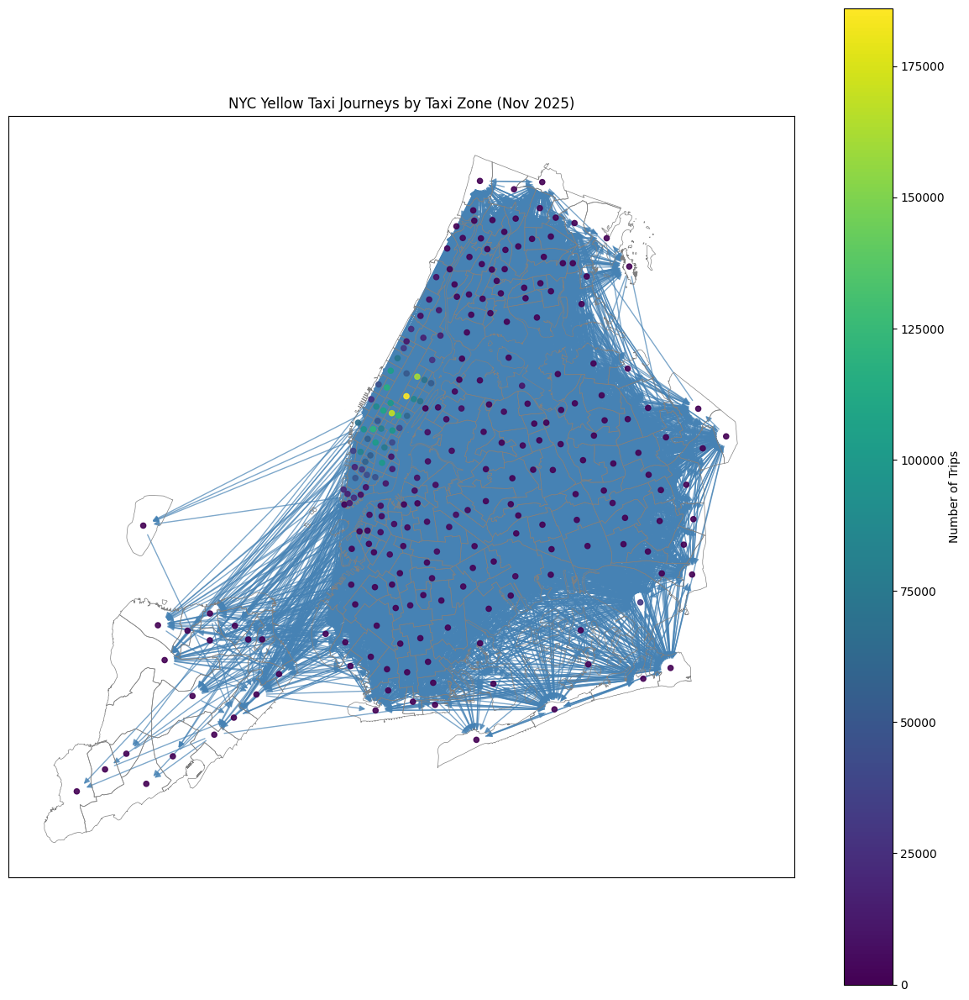

In [ ]:
# Initialise figure
fig, ax = plt.subplots(figsize=(12, 12))

# Draw zone boundaries
zones.boundary.plot(ax=ax, color="gray", linewidth=0.5)
ax.set_aspect("equal")

# Draw edges first
nx.draw_networkx_edges(
    G_zones,
    pos,
    ax=ax,
    edge_color="steelblue",
    alpha=0.7
)

# Draw nodes on top
nx.draw_networkx_nodes(
    G_zones,
    pos,
    ax=ax,
    node_size=20,
    node_color=trip_counts_per_zone,
    cmap="viridis", 
    alpha=0.9
)

sm = plt.cm.ScalarMappable(cmap="viridis", 
                           norm=plt.Normalize(vmin=trip_counts_per_zone.min(), 
                                              vmax=trip_counts_per_zone.max()))
sm.set_array([])

plt.colorbar(sm, ax=ax, label="Number of Trips")


#Display graph
plt.title("NYC Yellow Taxi Journeys by Taxi Zone (Oct 2025)")
plt.tight_layout()
plt.show()

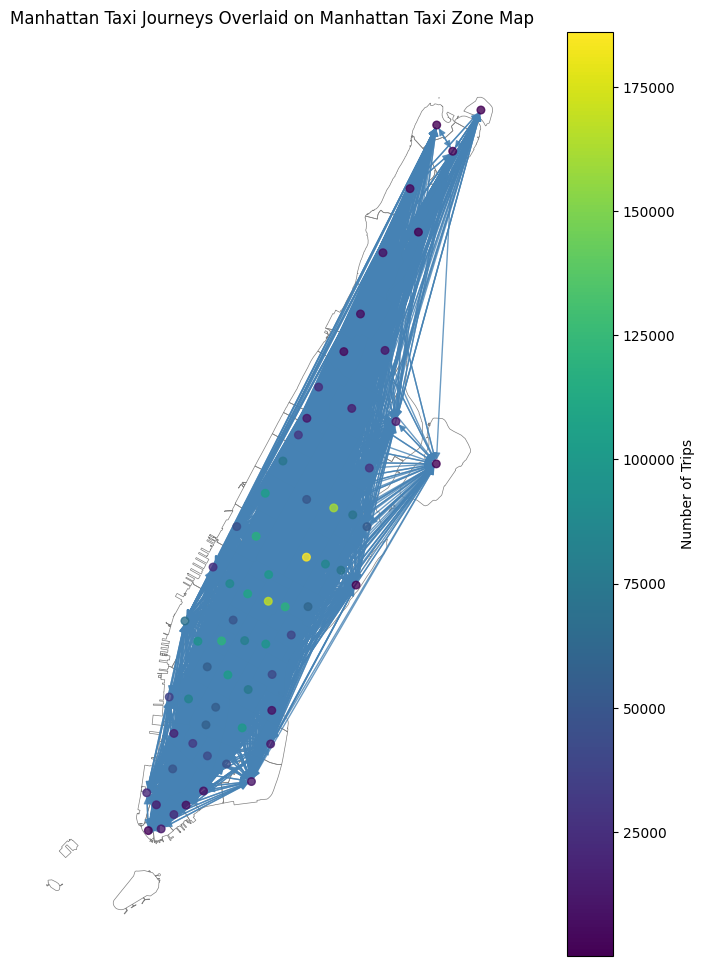

In [54]:
# Filter to Brooklyn only
Manhattan = zones[zones["borough"] == "Manhattan"].copy()

# Reproject if needed
Manhattan = Manhattan.to_crs(epsg=2263)

# Compute centroids
Manhattan["center"] = Manhattan.geometry.centroid

# Build pos dictionary
pos_man = {
    int(row["objectid"]): (row["center"].x, row["center"].y)
    for _, row in Manhattan.iterrows()
}

# Filter graph to Brooklyn nodes only
G_Manhattan = G.subgraph(pos.keys()).copy()


manhattan_zone_ids = zones.loc[zones["borough"] == "Manhattan", "objectid"].tolist()
all_trips_manhattan = all_trips[
    all_trips["PULocationID"].isin(manhattan_zone_ids) |
    all_trips["DOLocationID"].isin(manhattan_zone_ids)
]

trip_counts_manhattan = (
    all_trips_manhattan
    .groupby("PULocationID")
    .size()
    .reindex(G_Manhattan.nodes(), fill_value=0)
)

# Plot
fig, ax = plt.subplots(figsize=(12, 12))

Manhattan.plot(ax=ax, facecolor="none", edgecolor="gray", linewidth=0.5)

nx.draw(
    G_Manhattan,
    pos_man,
    ax=ax,
    node_size=30,
    node_color=trip_counts_manhattan,
    cmap = "viridis",
    edge_color="steelblue",
    #width=[G_Manhattan[u][v]["weight"] / 50 for u, v in G_Manhattan.edges()],
    arrows=True,
    alpha=0.8
)

sm = plt.cm.ScalarMappable(cmap="viridis", 
                           norm=plt.Normalize(vmin=trip_counts_manhattan.min(), 
                                              vmax=trip_counts_manhattan.max()))
sm.set_array([])

plt.colorbar(sm, ax=ax, label="Number of Trips")

plt.title("Manhattan Taxi Journeys Overlaid on Manhattan Taxi Zone Map")
plt.show()


## Chapter 5: Additional Data Manipulation and Cleaning ##

- Filter down to routes with more than x no of journeys
- Could use summary stats here

In [25]:
route_counts = (all_trips.groupby(["PULocationID", "DOLocationID"]).size().reset_index(name="count")
)
route_counts["count"].describe()

count    29794.000000
mean       119.603007
std        586.056107
min          1.000000
25%          2.000000
50%          5.000000
75%         20.000000
max      28071.000000
Name: count, dtype: float64

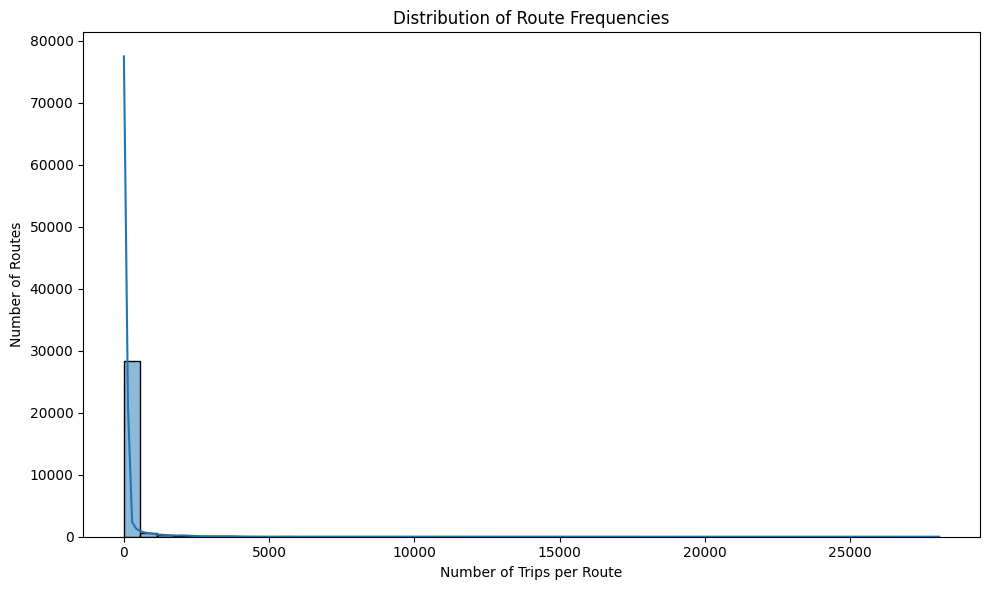

In [26]:
plt.figure(figsize=(10, 6))
sns.histplot(route_counts["count"], bins=50, kde=True)

plt.title("Distribution of Route Frequencies")
plt.xlabel("Number of Trips per Route")
plt.ylabel("Number of Routes")
plt.tight_layout()
plt.show()


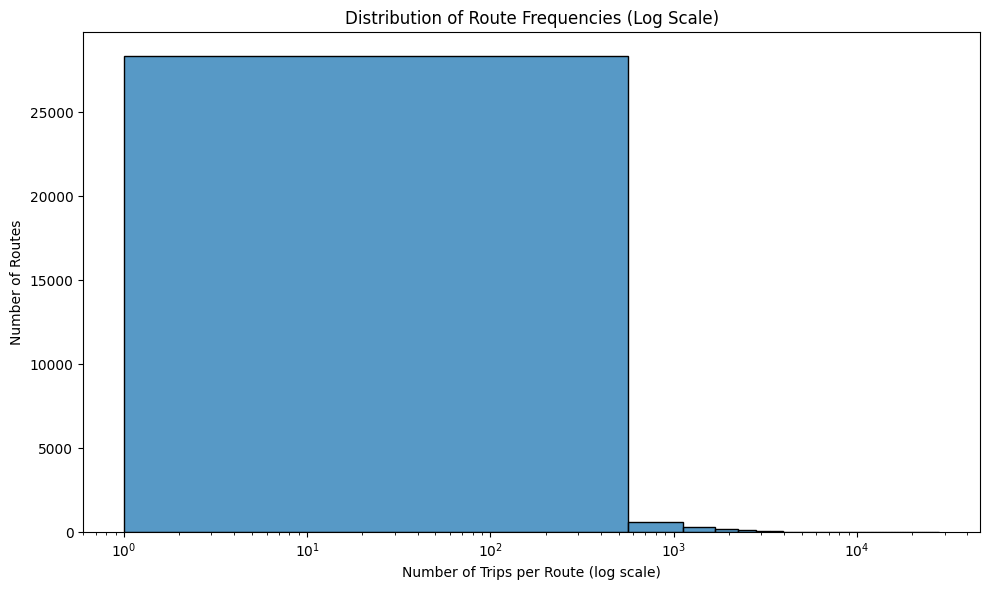

In [27]:
plt.figure(figsize=(10, 6))
sns.histplot(route_counts["count"], bins=50)
plt.xscale("log")

plt.title("Distribution of Route Frequencies (Log Scale)")
plt.xlabel("Number of Trips per Route (log scale)")
plt.ylabel("Number of Routes")
plt.tight_layout()
plt.show()


In [28]:
# Explain why you will not be filtering the data further by no. of journeys

## Chapter 6: Centrality Measures ##

In [52]:
def plot_centrality_measures(G, pos, borough_gdf):
    """
    Compute and plot several centrality measures on a GeoDataFrame background.
    
    Parameters
    ----------
    G : networkx.Graph
        The graph to analyze.
    pos : dict
        Node positions for plotting.
    borough_gdf : GeoDataFrame
        GeoDataFrame containing the borough boundary for background.
    """

    # Always safe centrality measures
    deg = nx.degree_centrality(G)
    close = nx.closeness_centrality(G)
    bet = nx.betweenness_centrality(G)
    eig = nx.eigenvector_centrality(G)
    pagerank = nx.pagerank(G)

    measures = [deg, close, bet, eig, pagerank]
    measure_names = [
        'Degree Centrality',
        'Closeness Centrality',
        'Betweenness Centrality',
        'Eigenvector Centrality',
        'PageRank',
    ]

    # Try eccentricity only if graph is connected
    try:
        if nx.is_connected(G.to_undirected()):
            ecc = nx.eccentricity(G)
            measures.append(ecc)
            measure_names.append('Eccentricity')
    except nx.NetworkXError:
        print("⚠️ Graph is not connected — skipping eccentricity.")


    # Plot each measure
    for name, measure in zip(measure_names, measures):

        fig, ax = plt.subplots(figsize=(10, 10))

        borough_gdf.plot(ax=ax, facecolor="none", edgecolor="gray", linewidth=0.5)

        nodes = nx.draw_networkx_nodes(
            G,
            pos,
            ax=ax,
            node_color=list(measure.values()),
            nodelist=list(measure.keys()),
            cmap=plt.cm.spring
        )

        nodes.set_norm(mcolors.SymLogNorm(linthresh=0.01, linscale=1, base=10))

        nx.draw_networkx_edges(G, pos, ax=ax, alpha=0.5)
        #nx.draw_networkx_labels(G, pos, ax=ax, font_size=6)

        nx.draw_networkx_labels(
            G,
            pos,
            labels={n: f"{v:.3f}" for n, v in measure.items()},   # ⭐ show values instead of node IDs
            font_size=6,
            ax=ax
        )


        ax.set_title(name)
        plt.colorbar(nodes, ax=ax)

        ax.set_axis_off()
        plt.tight_layout()
        plt.show()




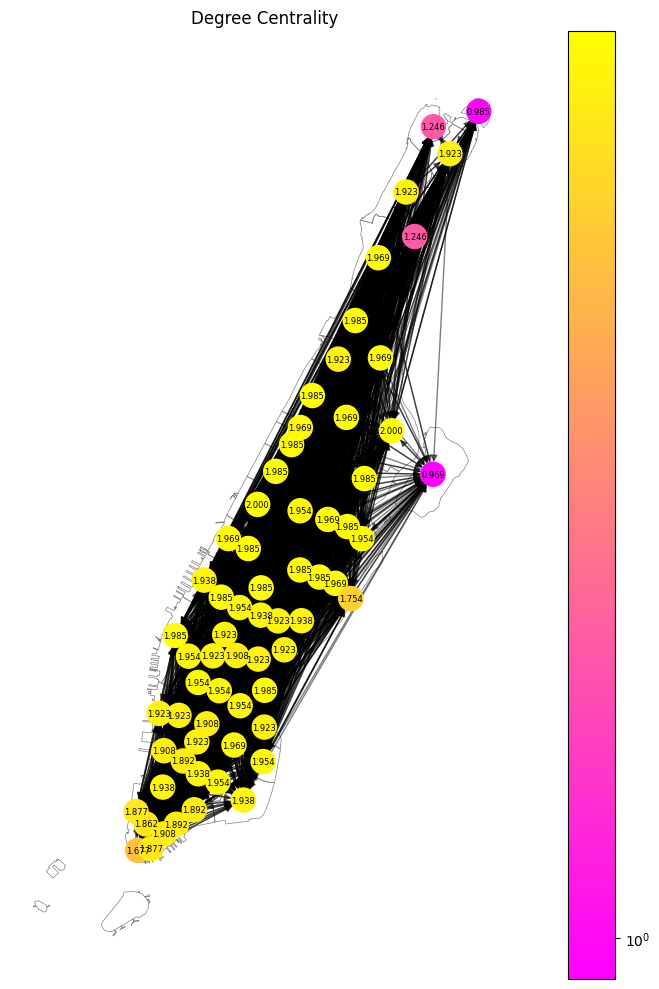

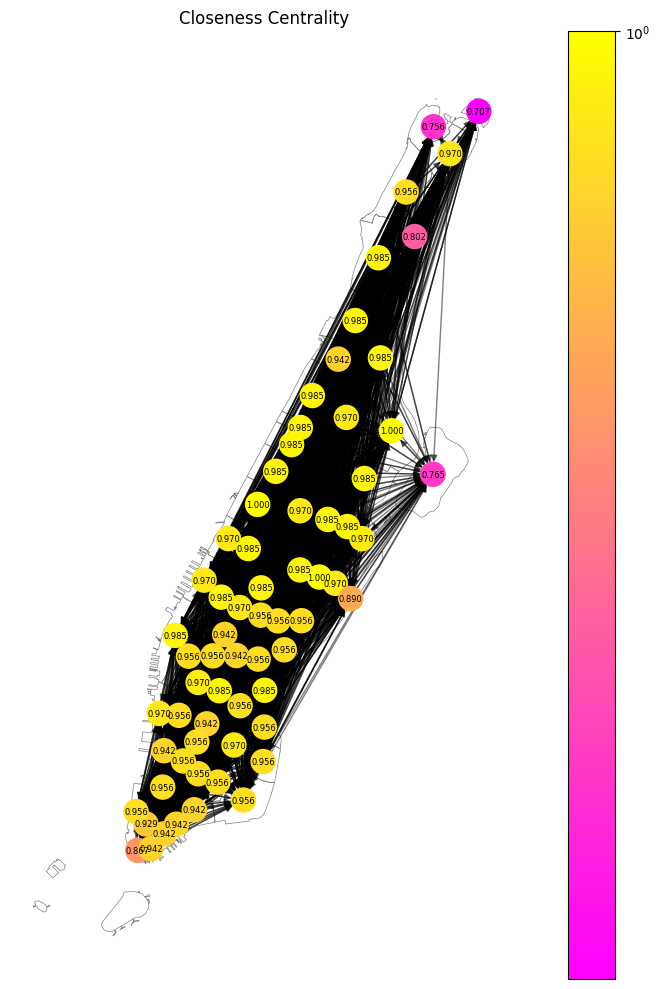

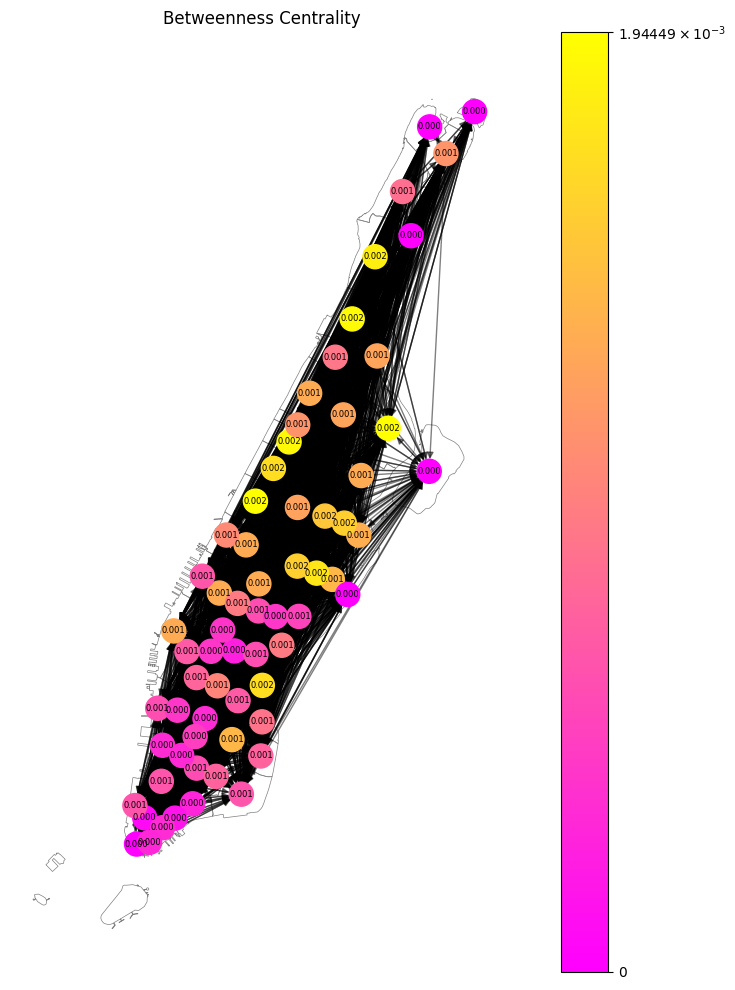

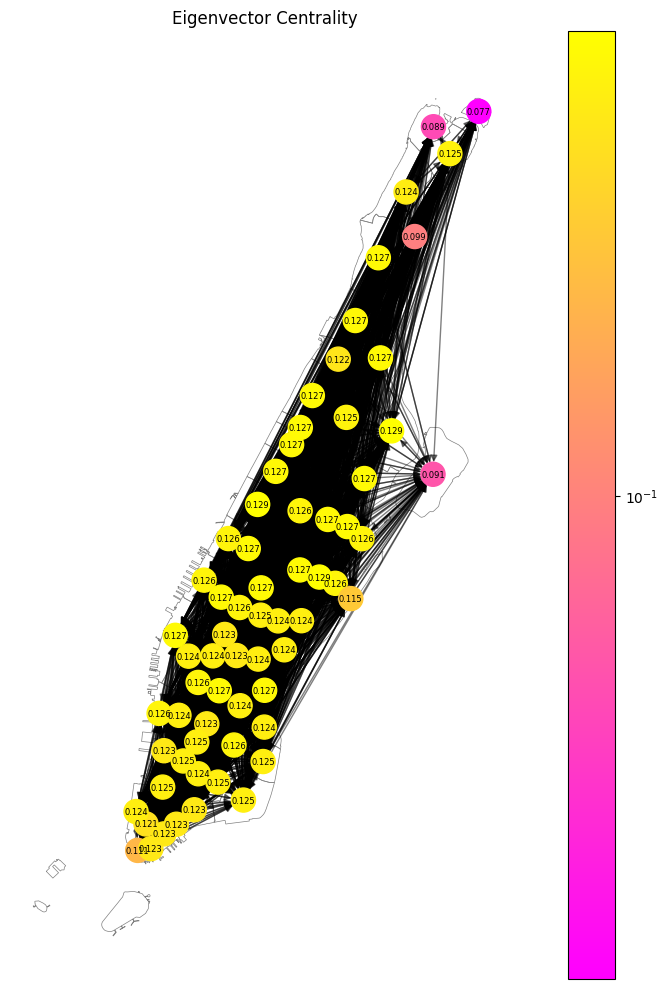

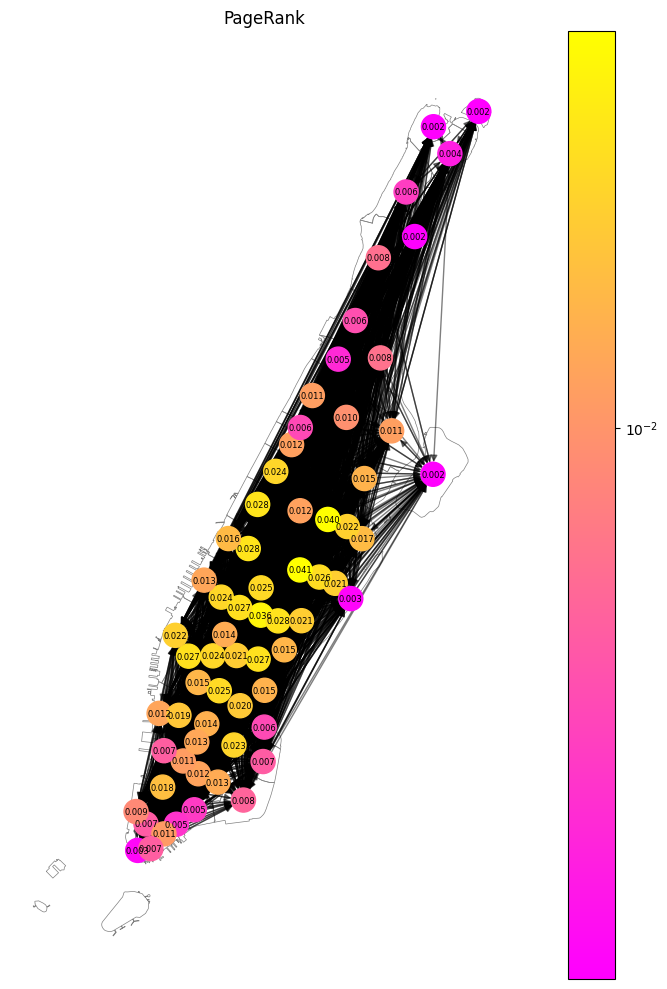

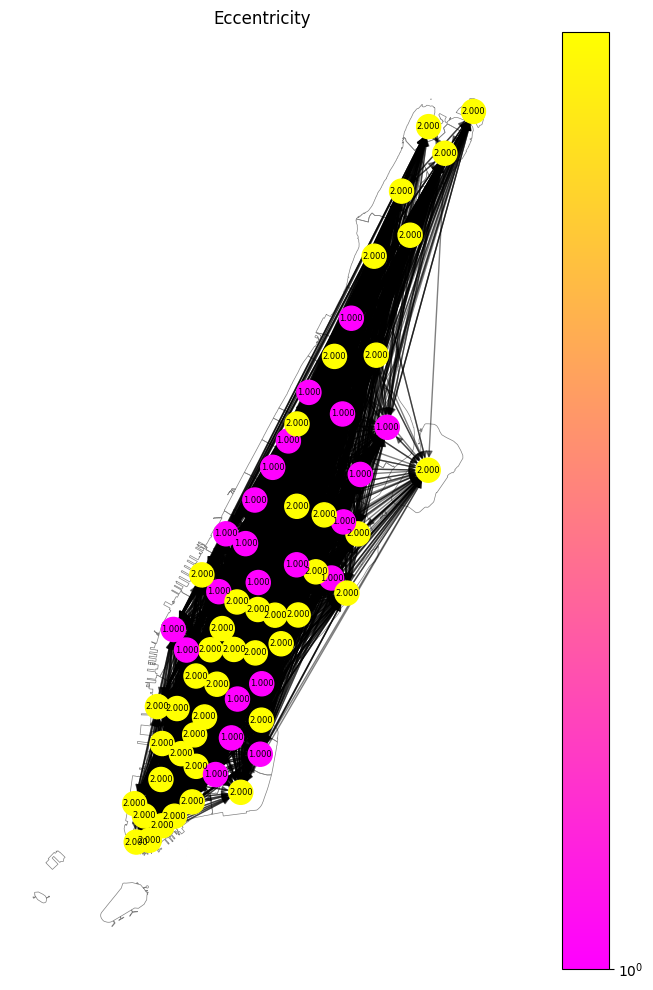

In [53]:
plot_centrality_measures(G_Manhattan, pos, Manhattan)

Insert description of each chart and insights gained

## Chapter 7: Visualisations ##

### Analysis 1: Most Common Journeys ###

### Analysis 2: Importance of node by hour ###


In [ ]:
lookup_man = Manhattan.set_index("location_id")["objectid"].to_dict()

all_trips_manhattan["PU_obj"] = all_trips_manhattan["PULocationID"].map(lookup_man)
all_trips_manhattan["DO_obj"] = all_trips_manhattan["DOLocationID"].map(lookup_man)

all_trips_manhattan["hour"] = all_trips_manhattan["tpep_pickup_datetime"].dt.hour

hourly_graphs = {}
hourly_centrality_man = {}

for h in range(24):
    df_h = all_trips_manhattan[all_trips_manhattan["hour"] == h]

    G_h = nx.DiGraph()
    edges_h = (
        df_h.groupby(["PU_obj", "DO_obj"])
            .size()
            .reset_index(name="weight")
    )

    for _, row in edges_h.iterrows():
        s, d, w = int(row["PU_obj"]), int(row["DO_obj"]), int(row["weight"])
        if s != d:
            G_h.add_edge(s, d, weight=w)

    if len(G_h.nodes()) == 0:
        hourly_centrality_man[h] = {}
        continue

    hourly_graphs[h] = G_h
    hourly_centrality_man[h] = nx.degree_centrality(G_h)

print("[Centrality] Manhattan hourly centrality computed")


# ---------------------------------------------------------
# 5. CONVERT BROOKLYN POLYGONS TO PLOTLY SHAPES
# ---------------------------------------------------------

from shapely.geometry import Polygon, MultiPolygon

manhattan_shapes = []

for _, row in Manhattan.iterrows():
    geom = row.geometry

    # Handle Polygon and MultiPolygon correctly
    if isinstance(geom, Polygon):
        polys = [geom]
    elif isinstance(geom, MultiPolygon):
        polys = list(geom.geoms)
    else:
        continue

    # Convert each polygon to a Plotly scatter shape
    for poly in polys:
        x, y = poly.exterior.xy
        manhattan_shapes.append(
        go.Scatter(
            x=list(x),   # ← FIX
            y=list(y),   # ← FIX
            fill="toself",
            fillcolor="rgba(200,200,200,0.2)",
            line=dict(color="black", width=1),
            hoverinfo="skip",
            showlegend=False
        )
    )




# ---------------------------------------------------------
# 6. BUILD ANIMATION FRAMES
# ---------------------------------------------------------

frames = []

for h in range(24):
    cent = hourly_centrality_man[h]

    # Node sizes and colors
    sizes = [cent.get(n, 0) * 80 for n in G_Manhattan.nodes()]
    colors = [cent.get(n, 0) for n in G_Manhattan.nodes()]

    # ---- TOP 10 CENTRAL NODES ----
    top10 = sorted(cent.items(), key=lambda x: x[1], reverse=True)[:10]

    # Build annotation text
    annotation_text = "<b>Top 10 Zones (Hour {})</b><br>".format(h)
    for rank, (node, value) in enumerate(top10, start=1):
        annotation_text += f"{rank}. Zone {node}: {value:.4f}<br>"

    # Annotation object
    annotations = [
        dict(
            xref="paper",
            yref="paper",
            x=0.15,
            y=0.95,
            align="left",
            text=annotation_text,
            showarrow=False,
            font=dict(size=12)
        )
    ]

    # ---- FRAME ----
    frames.append(
        go.Frame(
            data=
                manhattan_shapes + [
                    go.Scatter(
                        x=[pos_man[n][0] for n in G_Manhattan.nodes()],
                        y=[pos_man[n][1] for n in G_Manhattan.nodes()],
                        mode="markers",
                        marker=dict(
                            size=sizes,
                            color=colors,
                            colorscale="Plasma",
                            showscale=True
                        ),
                        text=[f"Zone {n}" for n in G_Manhattan.nodes()],
                        hoverinfo="text"
                    )
                ],
            name=str(h),
            layout=go.Layout(annotations=annotations)
        )
    )



# ---------------------------------------------------------
# 7. BASE FIGURE + PLAY BUTTON
# ---------------------------------------------------------

fig = go.Figure(
    data=manhattan_shapes + [
        go.Scatter(
            x=[pos_man[n][0] for n in G_Manhattan.nodes()],
            y=[pos_man[n][1] for n in G_Manhattan.nodes()],
            mode="markers",
            marker=dict(size=5, color="gray")
        )
    ],
    layout=go.Layout(
        title="Manhattan Hourly Centrality Animation",
        height=1200,
        xaxis=dict(visible=False),
        yaxis=dict(visible=False),
        updatemenus=[
            dict(
                type="buttons",
                showactive=False,
                buttons=[
                    dict(
                        label="Play",
                        method="animate",
                        args=[None, {
                            "frame": {"duration": 500, "redraw": True},
                            "fromcurrent": True
                        }]
                    ),
                    dict(
                        label="Pause",
                        method="animate",
                        args=[[None], {
                            "frame": {"duration": 0},
                            "mode": "immediate"
                        }]
                    )
                ]
            )
        ],
        sliders=[
            dict(
                steps=[
                    dict(method="animate", args=[[str(h)]], label=str(h))
                    for h in range(24)
                ],
                transition={"duration": 0},
                x=0.1,
                len=0.9
            )
        ]
    ),
    frames=frames
)

initial_cent = hourly_centrality_man[0]
top10_initial = sorted(initial_cent.items(), key=lambda x: x[1], reverse=True)[:10]

initial_text = "<b>Top 10 Zones (Hour 0)</b><br>"
for rank, (node, value) in enumerate(top10_initial, start=1):
    initial_text += f"{rank}. Zone {node}: {value:.4f}<br>"


fig.show()


/var/folders/5d/_70z8cj573dcc1vb6ywm64fh0000gn/T/ipykernel_64868/512572627.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/5d/_70z8cj573dcc1vb6ywm64fh0000gn/T/ipykernel_64868/512572627.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/5d/_70z8cj573dcc1vb6ywm64fh0000gn/T/ipykernel_64868/512572627.py:43: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the d

[Centrality] Manhattan hourly centrality computed


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/plotly/io/_renderers.py:51: UserWarning:

Plotly version >= 6 requires Jupyter Notebook >= 7 but you have 6.4.12 installed.
 To upgrade Jupyter Notebook, please run `pip install notebook --upgrade`.



In [64]:

# ---------------------------------------------------------
# 1. Build zone name lookup
# ---------------------------------------------------------

zone_name_lookup = Manhattan.set_index("objectid")["zone"].to_dict()


# ---------------------------------------------------------
# 2. Build tidy dataframe of top-10 per hour
# ---------------------------------------------------------

records = []

for h in range(24):
    cent = hourly_centrality_man[h]

    # Remove invalid zones (e.g., -1)
    cent = {k: v for k, v in cent.items() if k in zone_name_lookup}

    # Sort and take top 10
    top10 = sorted(cent.items(), key=lambda x: x[1], reverse=True)[:10]

    for node, value in top10:
        records.append({
            "hour": h,
            "zone_id": node,
            "zone_name": zone_name_lookup[node],
            "centrality": value
        })

df_top10 = pd.DataFrame(records)

# Unique zones that appear in top 10
zones_to_plot = df_top10["zone_id"].unique()


# ---------------------------------------------------------
# 3. Build the line chart
# ---------------------------------------------------------

fig_line = go.Figure()

for zone_id in zones_to_plot:
    df_zone = df_top10[df_top10["zone_id"] == zone_id].sort_values("hour")

    fig_line.add_trace(
        go.Scatter(
            x=df_zone["hour"],
            y=df_zone["centrality"],
            mode="lines+markers",
            name=df_zone["zone_name"].iloc[0],   # use zone name
            line=dict(width=3),
            marker=dict(size=6)
        )
    )


# ---------------------------------------------------------
# 4. Layout
# ---------------------------------------------------------

fig_line.update_layout(
    title="Centrality Over Time for Top Manhattan Zones",
    xaxis=dict(title="Hour of Day", dtick=1),
    yaxis=dict(title="Centrality"),
    height=650,
    legend=dict(
        title="Zone Name",
        orientation="v",
        x=1.05,
        y=1
    )
)

fig_line.show()


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/plotly/io/_renderers.py:51: UserWarning:

Plotly version >= 6 requires Jupyter Notebook >= 7 but you have 6.4.12 installed.
 To upgrade Jupyter Notebook, please run `pip install notebook --upgrade`.



### Analysis 3: Classifying Zones in Brooklyn ###

In [65]:
def compute_hits(hourly_graphs, zones_man):
    """
    hourly_graphs: dict {hour: DiGraph}
    zones_bk: GeoDataFrame with 'objectid' and 'zone'
    """

    valid_nodes = set(zones_man["objectid"].astype(int))
    zone_name_lookup = zones_man.set_index("objectid")["zone"].to_dict()

    records = []

    for h, G_h in hourly_graphs.items():

        # Filter graph to valid Mahattan nodes only
        G_clean = nx.DiGraph()
        for u, v, data in G_h.edges(data=True):
            if u in valid_nodes and v in valid_nodes:
                G_clean.add_edge(u, v, **data)

        if len(G_clean.nodes()) == 0:
            continue

        # ---- HITS (hub + authority) ----
        hubs, auths = nx.hits(G_clean, max_iter=500, normalized=True)

        # ---- Store results ----
        for node in G_clean.nodes():
            records.append({
                "hour": h,
                "zone_id": node,
                "zone_name": zone_name_lookup[node],
                "hub_score": hubs.get(node, 0),
                "authority_score": auths.get(node, 0)
            })

    return pd.DataFrame(records)


In [67]:
df_hits = compute_hits(hourly_graphs, Manhattan)
df_hits.head()

,hour,zone_id,zone_name,hub_score,authority_score
0,0,4,Alphabet City,0.012059,0.014406
1,0,13,Battery Park City,0.002217,0.009417
2,0,24,Bloomingdale,0.002111,0.004366
3,0,41,Central Harlem,0.002758,0.007340
4,0,42,Central Harlem North,0.001515,0.005372


In [68]:
df_hits_hour = df_hits[df_hits["hour"] == h].copy()

hub_med = df_hits_hour["hub_score"].median()
auth_med = df_hits_hour["authority_score"].median()

def classify(row):
    if row["hub_score"] >= hub_med and row["authority_score"] >= auth_med:
        return "Core (High Hub, High Authority)"
    elif row["hub_score"] >= hub_med and row["authority_score"] < auth_med:
        return "Origin Hub (High Hub, Low Authority)"
    elif row["hub_score"] < hub_med and row["authority_score"] >= auth_med:
        return "Destination Authority (Low Hub, High Authority)"
    else:
        return "Peripheral (Low Hub, Low Authority)"

df_hits_hour["quadrant"] = df_hits_hour.apply(classify, axis=1)

df_map = Manhattan.merge(
    df_hits_hour,
    left_on="objectid",
    right_on="zone_id",
    how="left"
)

quadrant_colors = {
    "Core (High Hub, High Authority)": "#CE90E0",        # blue
    "Origin Hub (High Hub, Low Authority)": "#8d96db",   # green
    "Destination Authority (Low Hub, High Authority)": "#df7f81",  # red
    "Peripheral (Low Hub, Low Authority)": "#c2db8d"     # grey
    
}

df_map["color"] = df_map["quadrant"].map(quadrant_colors).fillna("#cccccc")

fig = go.Figure()

for _, row in df_map.iterrows():
    geom = row.geometry

    if isinstance(geom, Polygon):
        polys = [geom]  # wrap single polygon in a list
    elif isinstance(geom, MultiPolygon):
        polys = list(geom.geoms)  # extract all polygons
    else:
        continue

    for poly in polys:
        x, y = poly.exterior.xy

        x = list(x) 
        y = list(y) 

        fig.add_trace(go.Scatter(
            x=x,
            y=y,
            fill="toself",
            fillcolor=row["color"],
            line=dict(color="black", width=0.5),
            name=row["zone_name"],
            hovertemplate=(
                f"<b>{row['zone_name']}</b><br>"
                f"Hub Score: {row['hub_score']:.4f}<br>"
                f"Authority Score: {row['authority_score']:.4f}<br>"
                f"Role: {row['quadrant']}"
            ),
            showlegend=False
        ))

# ---- Add Legend ----
legend_items = {
    "Core (High Hub, High Authority)": "#CE90E0",        
    "Origin Hub (High Hub, Low Authority)": "#8d96db",   
    "Destination Authority (Low Hub, High Authority)": "#df7f81", 
    "Peripheral (Low Hub, Low Authority)": "#c2db8d"    
}

for name, color in legend_items.items():
    fig.add_trace(go.Scatter(
        x=[None], y=[None],   # invisible point
        mode="markers",
        marker=dict(size=15, color=color),
        name=name,
        showlegend=True
    ))



fig.update_layout(
    title="HITS Quadrant Map",
    xaxis=dict(visible=False),
    yaxis=dict(visible=False),
    height=1000,
    width=1100,
    legend=dict( title="Zone Roles", orientation="v", x=1.02, y=1)
)

fig.show()



/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/plotly/io/_renderers.py:51: UserWarning:

Plotly version >= 6 requires Jupyter Notebook >= 7 but you have 6.4.12 installed.
 To upgrade Jupyter Notebook, please run `pip install notebook --upgrade`.



In [69]:
# Compute combined importance
df_hits_hour["combined"] = df_hits_hour["hub_score"] + df_hits_hour["authority_score"]

# Filter to Core quadrant
df_core = df_hits_hour[df_hits_hour["quadrant"] == "Core (High Hub, High Authority)"]

# Take top 10
df_top_core = df_core.sort_values("combined", ascending=False).head(10)

# Bar chart
fig = px.bar(
    df_top_core,
    x="zone_name",
    y="combined",
    title=f"Top 10 Most Important HITS Nodes",
    labels={"combined": "HITS Importance (Hub + Authority)"},
    text="combined"
)

#fig.update_traces(texttemplate="%{text:.4f}", textposition="outside")
fig.update_layout(xaxis_tickangle=-45, height=600)

fig.show()


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/plotly/io/_renderers.py:51: UserWarning:

Plotly version >= 6 requires Jupyter Notebook >= 7 but you have 6.4.12 installed.
 To upgrade Jupyter Notebook, please run `pip install notebook --upgrade`.



## Chapter 8: Analysis ##

## Chapter 9: Conclusion ##
- Further work: Filtering by individual providers, additional boroughs

## Chapter 9: References ##
